## Import libraries

In [38]:
# Base libraries
import pandas as pd
import numpy as np
from pyforest import *

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# sklearn
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error

import warnings
warnings.filterwarnings("ignore")


import pickle
# import yaml


## Exploring the database

In [39]:
# Open the excel database 
# In Row the 184 countries and the years
economy = pd.read_excel('C:/Users/igrav/Desktop/ironhack/Lecture/Week_9/Project/Data/Data_economy_Source.xlsx')
pd.set_option('display.max_columns', None)
economy.head()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,Country Name,Country Code,Years,Access to electricity (% of population),"Adolescent fertility rate (births per 1,000 women ages 15-19)",Age dependency ratio (% of working-age population),"Agriculture, value added (% of GDP)","Agriculture, value added (annual % growth)","Agriculture, value added (constant 2005 US$)","Air transport, registered carrier departures worldwide","Automated teller machines (ATMs) (per 100,000 adults)","Borrowers from commercial banks (per 1,000 adults)",Consumer price index (2010 = 100),"Contributing family workers, female (% of female employment) (modeled ILO estimate)","Contributing family workers, male (% of male employment) (modeled ILO estimate)","Contributing family workers, total (% of total employment) (modeled ILO estimate)",CPIA economic management cluster average (1=low to 6=high),CPIA financial sector rating (1=low to 6=high),CPIA gender equality rating (1=low to 6=high),CPIA macroeconomic management rating (1=low to 6=high),CPIA policies for social inclusion/equity cluster average (1=low to 6=high),CPIA property rights and rule-based governance rating (1=low to 6=high),CPIA social protection rating (1=low to 6=high),Depth of credit information index (0=low to 8=high),Domestic credit provided by financial sector (% of GDP),Domestic credit to private sector (% of GDP),Electric power consumption (kWh per capita),"Employers, female (% of female employment) (modeled ILO estimate)","Employers, male (% of male employment) (modeled ILO estimate)","Employers, total (% of total employment) (modeled ILO estimate)",Employment in agriculture (% of total employment) (modeled ILO estimate),"Employment in agriculture, female (% of female employment) (modeled ILO estimate)","Employment in agriculture, male (% of male employment) (modeled ILO estimate)",Employment in industry (% of total employment) (modeled ILO estimate),"Employment in industry, female (% of female employment) (modeled ILO estimate)","Employment in industry, male (% of male employment) (modeled ILO estimate)",Employment in services (% of total employment) (modeled ILO estimate),"Employment in services, female (% of female employment) (modeled ILO estimate)","Employment in services, male (% of male employment) (modeled ILO estimate)",Export value index (2000 = 100),Export volume index (2000 = 100),Exports of goods and services (% of GDP),Exports of goods and services (annual % growth),"Fertility rate, total (births per woman)",Fixed broadband Internet subscribers (per 100 people),"Foreign direct investment, net inflows (% of GDP)","Foreign direct investment, net outflows (% of GDP)",Fuel exports (% of merchandise exports),GDP growth (annual %),GDP per capita (constant 2005 US$),"GDP per capita, PPP (constant 2011 international $)",GDP per person employed (constant 1990 PPP $),GINI index (World Bank estimate),"Government expenditure on education, total (% of GDP)",Gross capital formation (% of GDP),Gross capital formation (annual % growth),"Gross fixed capital formation, private sector (% of GDP)",High-technology exports (% of manufactured exports),ICT goods imports (% total goods imports),Imports of goods and services (% of GDP),Individuals using the Internet (% of population),"Industry, value added (% of GDP)","Industry, value added (annual % growth)","Industry, value added (constant 2005 US$)","Inflation, consumer prices (annual %)",Informal payments to public officials (% of firms),International migrant stock (% of population),"Labor force participation rate, female (% of female population ages 15+) (modeled ILO estimate)","Labor force participation rate, male (% of male population ages 15+) (modeled ILO estimate)","Labor force participation rate, total (% of total population ages 15+) (modeled ILO estimate)",Labor force with advanced education (% of total working-age population with advanced education),"Labor force with advanced education, female (% of female working-age population with advanced education)","Labor force with advanced e

In [40]:
economy.shape


(2847, 373)

## Check, replace and drop clolumns with many missing values

In [41]:
economy = economy.apply(lambda x : x.replace("..", np.nan))
economy.tail()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,Country Name,Country Code,Years,Access to electricity (% of population),"Adolescent fertility rate (births per 1,000 women ages 15-19)",Age dependency ratio (% of working-age population),"Agriculture, value added (% of GDP)","Agriculture, value added (annual % growth)","Agriculture, value added (constant 2005 US$)","Air transport, registered carrier departures worldwide","Automated teller machines (ATMs) (per 100,000 adults)","Borrowers from commercial banks (per 1,000 adults)",Consumer price index (2010 = 100),"Contributing family workers, female (% of female employment) (modeled ILO estimate)","Contributing family workers, male (% of male employment) (modeled ILO estimate)","Contributing family workers, total (% of total employment) (modeled ILO estimate)",CPIA economic management cluster average (1=low to 6=high),CPIA financial sector rating (1=low to 6=high),CPIA gender equality rating (1=low to 6=high),CPIA macroeconomic management rating (1=low to 6=high),CPIA policies for social inclusion/equity cluster average (1=low to 6=high),CPIA property rights and rule-based governance rating (1=low to 6=high),CPIA social protection rating (1=low to 6=high),Depth of credit information index (0=low to 8=high),Domestic credit provided by financial sector (% of GDP),Domestic credit to private sector (% of GDP),Electric power consumption (kWh per capita),"Employers, female (% of female employment) (modeled ILO estimate)","Employers, male (% of male employment) (modeled ILO estimate)","Employers, total (% of total employment) (modeled ILO estimate)",Employment in agriculture (% of total employment) (modeled ILO estimate),"Employment in agriculture, female (% of female employment) (modeled ILO estimate)","Employment in agriculture, male (% of male employment) (modeled ILO estimate)",Employment in industry (% of total employment) (modeled ILO estimate),"Employment in industry, female (% of female employment) (modeled ILO estimate)","Employment in industry, male (% of male employment) (modeled ILO estimate)",Employment in services (% of total employment) (modeled ILO estimate),"Employment in services, female (% of female employment) (modeled ILO estimate)","Employment in services, male (% of male employment) (modeled ILO estimate)",Export value index (2000 = 100),Export volume index (2000 = 100),Exports of goods and services (% of GDP),Exports of goods and services (annual % growth),"Fertility rate, total (births per woman)",Fixed broadband Internet subscribers (per 100 people),"Foreign direct investment, net inflows (% of GDP)","Foreign direct investment, net outflows (% of GDP)",Fuel exports (% of merchandise exports),GDP growth (annual %),GDP per capita (constant 2005 US$),"GDP per capita, PPP (constant 2011 international $)",GDP per person employed (constant 1990 PPP $),GINI index (World Bank estimate),"Government expenditure on education, total (% of GDP)",Gross capital formation (% of GDP),Gross capital formation (annual % growth),"Gross fixed capital formation, private sector (% of GDP)",High-technology exports (% of manufactured exports),ICT goods imports (% total goods imports),Imports of goods and services (% of GDP),Individuals using the Internet (% of population),"Industry, value added (% of GDP)","Industry, value added (annual % growth)","Industry, value added (constant 2005 US$)","Inflation, consumer prices (annual %)",Informal payments to public officials (% of firms),International migrant stock (% of population),"Labor force participation rate, female (% of female population ages 15+) (modeled ILO estimate)","Labor force participation rate, male (% of male population ages 15+) (modeled ILO estimate)","Labor force participation rate, total (% of total population ages 15+) (modeled ILO estimate)",Labor force with advanced education (% of total working-age population with advanced education),"Labor force with advanced education, female (% of female working-age population with advanced education)","Labor force with advanced e

In [42]:
nulls_percent_df = pd.DataFrame(economy.isna().sum()/len(economy)).reset_index()
nulls_percent_df.columns = ['column_name', 'nulls_percentage']
nulls_percent_df

<IPython.core.display.Javascript object>

,column_name,nulls_percentage
0,Country Name,0.000000
1,Country Code,0.000000
2,Years,0.000000
3,Access to electricity (% of population),0.000000
4,"Adolescent fertility rate (births per 1,000 wo...",0.000000
...,...,...
368,Trading across borders: Time to export: Border...,0.182648
369,Trading across borders: Time to export: Docume...,0.182648
370,Trading across borders: Time to import (days) ...,0.187215
371,Trading across borders: Time to import: Border...,0.182648


In [43]:
def threshold(df, threshold ):
    nulls_percent_df = pd.DataFrame(df.isna().sum()/len(df)).reset_index()
    nulls_percent_df.columns = ['column_name', 'nulls_percentage']
    columns_above_threshold = nulls_percent_df[nulls_percent_df['nulls_percentage']>threshold]
    return list(columns_above_threshold['column_name'])
# Test your function here
threshold(economy, 0.5)

<IPython.core.display.Javascript object>

['CPIA economic management cluster average (1=low to 6=high)',
 'CPIA financial sector rating (1=low to 6=high)',
 'CPIA gender equality rating (1=low to 6=high)',
 'CPIA macroeconomic management rating (1=low to 6=high)',
 'CPIA policies for social inclusion/equity cluster average (1=low to 6=high)',
 'CPIA property rights and rule-based governance rating (1=low to 6=high)',
 'CPIA social protection rating (1=low to 6=high)',
 'Market capitalization of listed companies (% of GDP)',
 'Ease of doing business score (DB15 methodology)',
 'Enforcing contracts (DB16 methodology) - Score',
 'Enforcing contracts: Court structure and proceedings (0-5) (DB16 methodology)',
 'Enforcing contracts: Quality of judicial administration index (0-18) (DB17-19 methodology)',
 'Enforcing contracts: Quality of judicial processes index (0-19) (DB17-19 methodology) - Score',
 'Paying taxes: Time to comply with VAT refund (hours) (DB17-20 methodology)',
 'Paying taxes: Time to obtain VAT refund (weeks) (DB17

## Drop the unrelevant columns with many missing values

In [44]:
economy = economy.drop(['CPIA economic management cluster average (1=low to 6=high)',
 'CPIA financial sector rating (1=low to 6=high)',
 'CPIA gender equality rating (1=low to 6=high)',
 'CPIA macroeconomic management rating (1=low to 6=high)',
 'CPIA policies for social inclusion/equity cluster average (1=low to 6=high)',
 'CPIA property rights and rule-based governance rating (1=low to 6=high)',
 'CPIA social protection rating (1=low to 6=high)',
 'Market capitalization of listed companies (% of GDP)',
 'Ease of doing business score (DB15 methodology)',
 'Enforcing contracts (DB16 methodology) - Score',
 'Enforcing contracts: Court structure and proceedings (0-5) (DB16 methodology)',
 'Enforcing contracts: Quality of judicial administration index (0-18) (DB17-19 methodology)',
 'Enforcing contracts: Quality of judicial processes index (0-19) (DB17-19 methodology) - Score',
 'Paying taxes: Time to comply with VAT refund (hours) (DB17-20 methodology)',
 'Paying taxes: Time to obtain VAT refund (weeks) (DB17-20 methodology)',
 'Protecting minority investors: Extent of conflict of interest regulation index (0-10) (DB15-19 methodology)',
 'Protecting minority investors: Extent of shareholder governance index (0-10) (DB15-19 methodology)',
 'Rank: Dealing with construction permits (1=most business-friendly regulations)',
 'Rank: Ease of doing business index (1=most business-friendly regulations)',
 'Rank: Enforcing contracts (1=most business-friendly regulations)',
 'Rank: Getting credit (1=most business-friendly regulations)',
 'Rank: Getting electricity (1=most business-friendly regulations)',
 'Rank: Paying taxes (1=most business-friendly regulations)',
 'Rank: Protecting minority investors (1=most business-friendly regulations)',
 'Rank: Registering property (1=most business-friendly regulations)',
 'Rank: Resolving insolvency (1=most business-friendly regulations)',
 'Rank: Starting a business (1=most business-friendly regulations)',
 'Rank: Trading across borders (1=most business-friendly regulations)',
 'Registering property (DB16 methodology) - Score',
 'Registering property: Quality of land administration index (0-30) (DB17-19 methodology)',
 'Registering property: Quality of land administration index with Gender (0-30) (DB17-19 methodology) - Score',
 'Resolving insolvency (DB04-14 methodology) - Score'], axis =1)

## Check & fill  the missing value per country and per columns

In [45]:
economy.shape

(2847, 341)

In [46]:
my_cols = economy[economy.columns.difference(['Country Name', 'Country Code'])]
List  = my_cols.columns.to_list()

from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=3)
X = imputer.fit_transform(my_cols)
economy2 = pd.DataFrame(X)
economy2.columns = List
economy2 = economy2.astype(int)
economy2[['Country Name', 'Country Code']]=economy[['Country Name', 'Country Code']]
economy = economy2


<IPython.core.display.Javascript object>

In [47]:
economy.shape

(2847, 341)

# Selecting columns&rows, check correlation

## Distribution plots of numerical variables

In [48]:
# Get the numerical variables from our dataset.
numerical = economy.select_dtypes(include=np.number)
numerical.head()

<IPython.core.display.Javascript object>

,Access to electricity (% of population),"Adolescent fertility rate (births per 1,000 women ages 15-19)",Age dependency ratio (% of working-age population),"Agriculture, value added (% of GDP)","Agriculture, value added (annual % growth)","Agriculture, value added (constant 2005 US$)","Air transport, registered carrier departures worldwide","Automated teller machines (ATMs) (per 100,000 adults)","Borrowers from commercial banks (per 1,000 adults)",Consumer price index (2010 = 100),"Contributing family workers, female (% of female employment) (modeled ILO estimate)","Contributing family workers, male (% of male employment) (modeled ILO estimate)","Contributing family workers, total (% of total employment) (modeled ILO estimate)",Dealing with construction permits (DB06-15 methodology) - Score,Dealing with construction permits (DB16-20 methodology) - Score,Dealing with construction permits: Building quality control index (0-15) (DB16-20 methodology),Dealing with construction permits: Building quality control index (0-15) (DB16-20 methodology) - Score,Dealing with construction permits: Cost (% of Warehouse value),Dealing with construction permits: Cost (% of Warehouse value) - Score,Dealing with construction permits: Liability and insurance regimes index (0-2) (DB16-20 methodology),Dealing with construction permits: Procedures (number),Dealing with construction permits: Procedures (number) - Score,Dealing with construction permits: Professional certifications index (0-4) (DB16-20 methodology),Dealing with construction permits: Quality control after construction index (0-3) (DB16-20 methodology),Dealing with construction permits: Quality control before construction index (0-1) (DB16-20 methodology),Dealing with construction permits: Quality control during construction index (0-3) (DB16-20 methodology),Dealing with construction permits: Quality of building regulations index (0-2) (DB16-20 methodology),Dealing with construction permits: Time (days),Dealing with construction permits: Time (days) - Score,Depth of credit information index (0=low to 8=high),Domestic credit provided by financial sector (% of GDP),Domestic credit to private sector (% of GDP),Electric power consumption (kWh per capita),"Employers, female (% of female employment) (modeled ILO estimate)","Employers, male (% of male employment) (modeled ILO estimate)","Employers, total (% of total employment) (modeled ILO estimate)",Employment in agriculture (% of total employment) (modeled ILO estimate),"Employment in agriculture, female (% of female employment) (modeled ILO estimate)","Employment in agriculture, male (% of male employment) (modeled ILO estimate)",Employment in industry (% of total employment) (modeled ILO estimate),"Employment in industry, female (% of female employment) (modeled ILO estimate)","Employment in industry, male (% of male employment) (modeled ILO estimate)",Employment in services (% of total employment) (modeled ILO estimate),"Employment in services, female (% of female employment) (modeled ILO estimate)","Employment in services, male (% of male employment) (modeled ILO estimate)",Enforcing contracts (DB04-15 methodology) - Score,Enforcing contracts (DB17-20 methodology) - Score,Enforcing contracts: Alternative dispute resolution (0-3) (DB16-20 methodology),Enforcing contracts: Attorney fees (% of claim),Enforcing contracts: Case management (0-6) (DB16-20 methodology),Enforcing contracts: Cost (% of claim),Enforcing contracts: Cost (% of claim) - Score,Enforcing contracts: Court automation (0-4) (DB17-20 methodology),Enforcing contracts: Court fees (% of claim),Enforcing contracts: Court structure and proceedings (0-5) (DB17-20 methodology),Enforcing contracts: Enforcement fees (% of claim),Enforcing contracts: Enforcement of judgment (days),Enforcing contracts: Filing and service (days),Enforcing contracts: Procedures (number),Enforcing contracts: Procedures (number) - Score,Enforcing contracts: Quality of the judicial processes index (0-18) (D

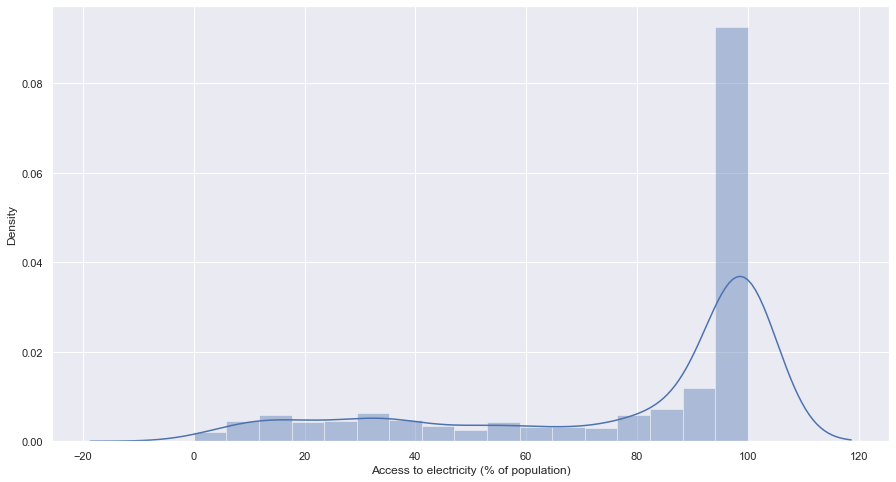

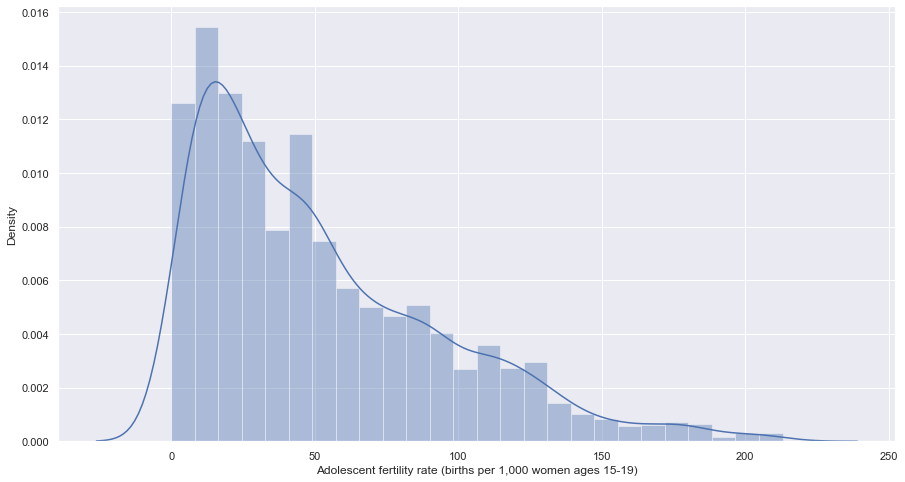

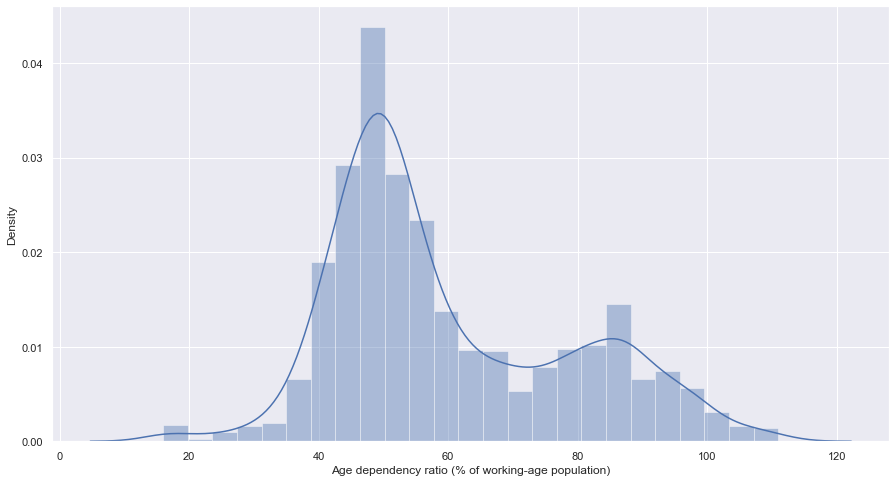

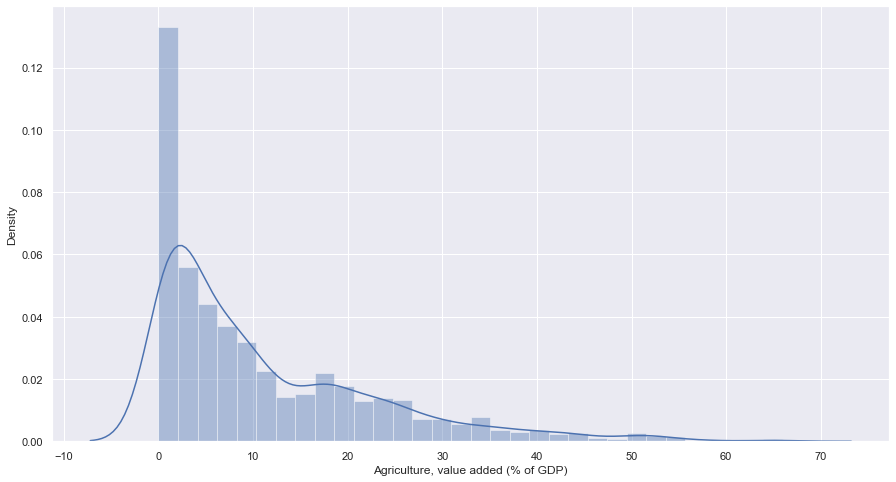

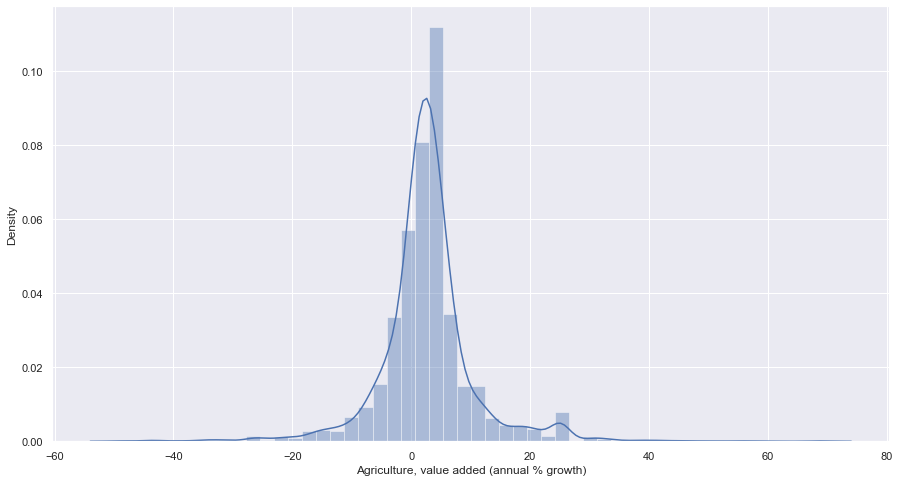

...

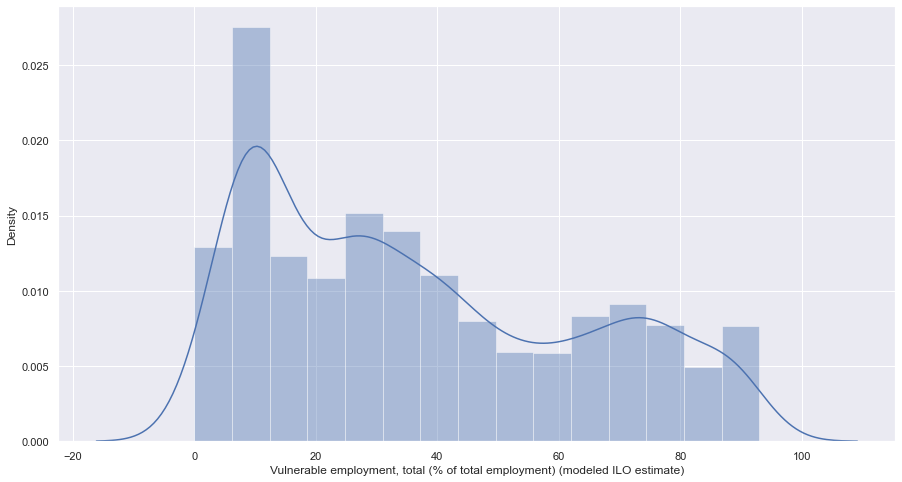

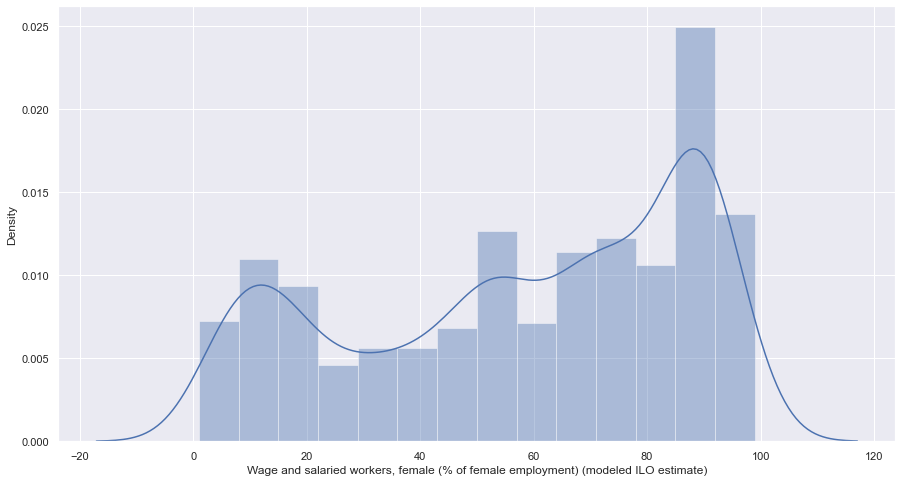

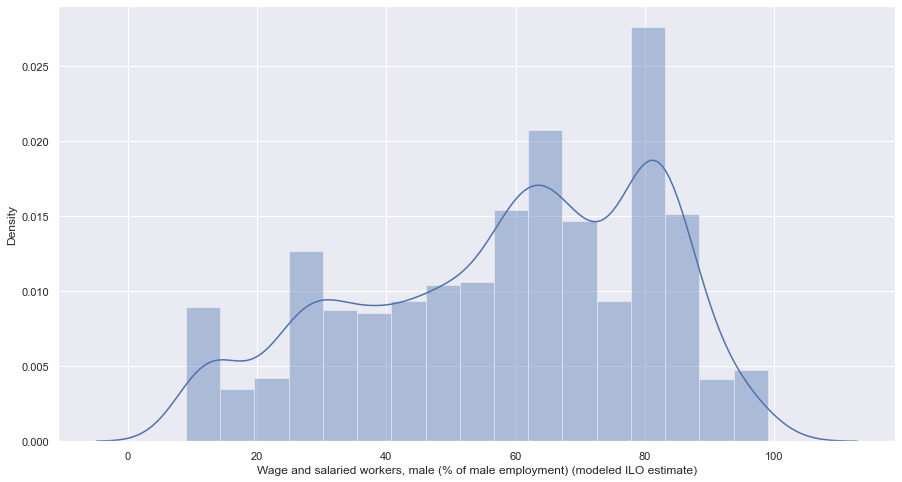

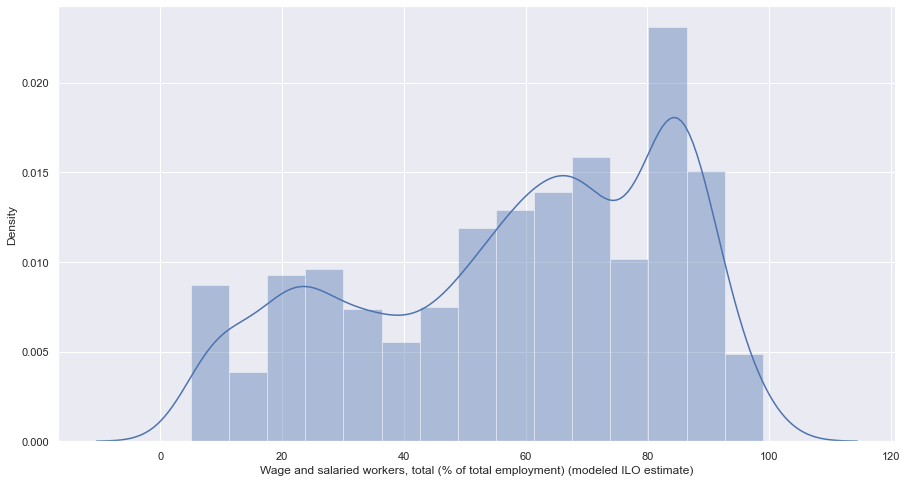

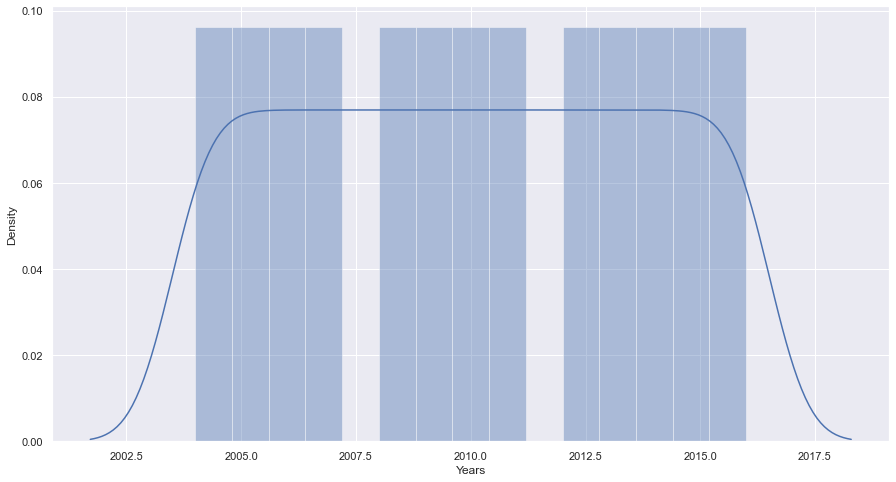

In [49]:
# Check using a distribution plot if the variables fit the theoretical normal or exponential distribution.
for column in numerical:
    sns.distplot(numerical[column])
    plt.show()

## Heatmap to check correlation, (output : 'GDP per capita')

,Access to electricity (% of population),"Adolescent fertility rate (births per 1,000 women ages 15-19)",Age dependency ratio (% of working-age population),"Agriculture, value added (% of GDP)","Agriculture, value added (annual % growth)","Agriculture, value added (constant 2005 US$)","Air transport, registered carrier departures worldwide","Automated teller machines (ATMs) (per 100,000 adults)","Borrowers from commercial banks (per 1,000 adults)",Consumer price index (2010 = 100),"Contributing family workers, female (% of female employment) (modeled ILO estimate)","Contributing family workers, male (% of male employment) (modeled ILO estimate)","Contributing family workers, total (% of total employment) (modeled ILO estimate)",Dealing with construction permits (DB06-15 methodology) - Score,Dealing with construction permits (DB16-20 methodology) - Score,Dealing with construction permits: Building quality control index (0-15) (DB16-20 methodology),Dealing with construction permits: Building quality control index (0-15) (DB16-20 methodology) - Score,Dealing with construction permits: Cost (% of Warehouse value),Dealing with construction permits: Cost (% of Warehouse value) - Score,Dealing with construction permits: Liability and insurance regimes index (0-2) (DB16-20 methodology),Dealing with construction permits: Procedures (number),Dealing with construction permits: Procedures (number) - Score,Dealing with construction permits: Professional certifications index (0-4) (DB16-20 methodology),Dealing with construction permits: Quality control after construction index (0-3) (DB16-20 methodology),Dealing with construction permits: Quality control before construction index (0-1) (DB16-20 methodology),Dealing with construction permits: Quality control during construction index (0-3) (DB16-20 methodology),Dealing with construction permits: Quality of building regulations index (0-2) (DB16-20 methodology),Dealing with construction permits: Time (days),Dealing with construction permits: Time (days) - Score,Depth of credit information index (0=low to 8=high),Domestic credit provided by financial sector (% of GDP),Domestic credit to private sector (% of GDP),Electric power consumption (kWh per capita),"Employers, female (% of female employment) (modeled ILO estimate)","Employers, male (% of male employment) (modeled ILO estimate)","Employers, total (% of total employment) (modeled ILO estimate)",Employment in agriculture (% of total employment) (modeled ILO estimate),"Employment in agriculture, female (% of female employment) (modeled ILO estimate)","Employment in agriculture, male (% of male employment) (modeled ILO estimate)",Employment in industry (% of total employment) (modeled ILO estimate),"Employment in industry, female (% of female employment) (modeled ILO estimate)","Employment in industry, male (% of male employment) (modeled ILO estimate)",Employment in services (% of total employment) (modeled ILO estimate),"Employment in services, female (% of female employment) (modeled ILO estimate)","Employment in services, male (% of male employment) (modeled ILO estimate)",Enforcing contracts (DB04-15 methodology) - Score,Enforcing contracts (DB17-20 methodology) - Score,Enforcing contracts: Alternative dispute resolution (0-3) (DB16-20 methodology),Enforcing contracts: Attorney fees (% of claim),Enforcing contracts: Case management (0-6) (DB16-20 methodology),Enforcing contracts: Cost (% of claim),Enforcing contracts: Cost (% of claim) - Score,Enforcing contracts: Court automation (0-4) (DB17-20 methodology),Enforcing contracts: Court fees (% of claim),Enforcing contracts: Court structure and proceedings (0-5) (DB17-20 methodology),Enforcing contracts: Enforcement fees (% of claim),Enforcing contracts: Enforcement of judgment (days),Enforcing contracts: Filing and service (days),Enforcing contracts: Procedures (number),Enforcing contracts: Procedures (number) - Score,Enforcing contracts: Quality of the judicial processes index (0-18) (D

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

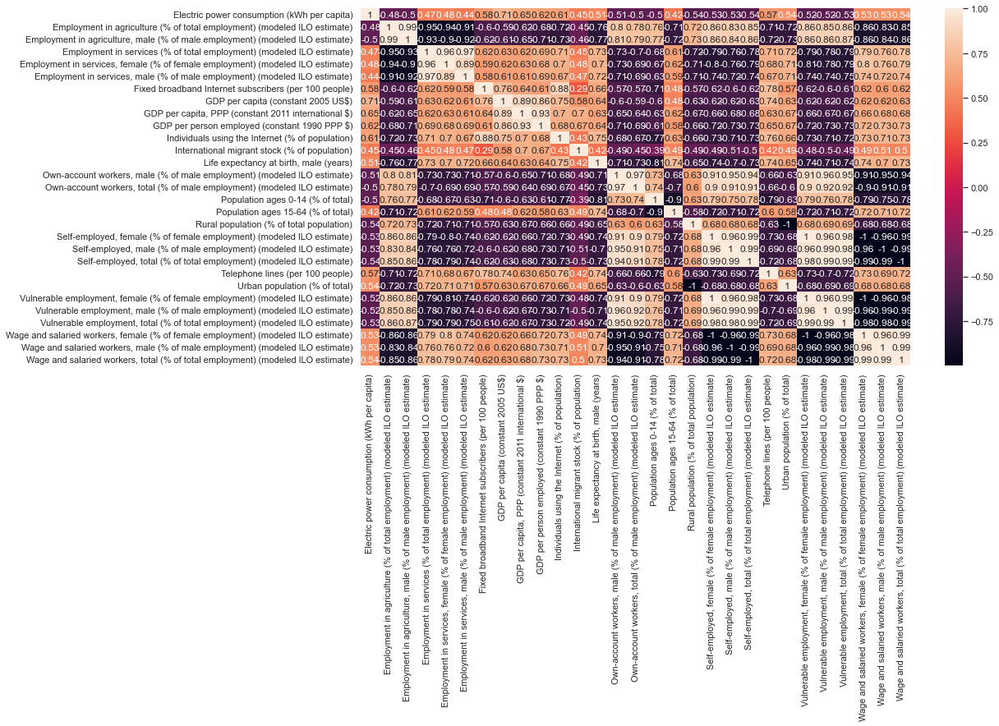

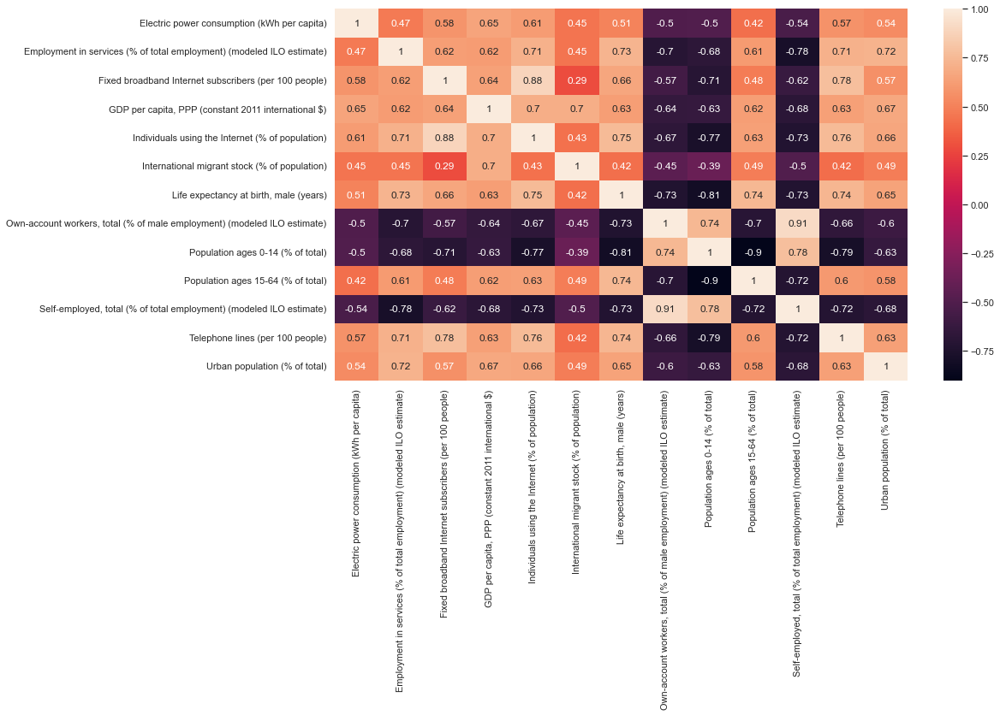

(2847, 13)

In [50]:
num = economy.select_dtypes("number")
display(num.head())

cf = 0.6

columns = []
corr_matrix = num.corr()

for col in num.columns:
        if (abs(corr_matrix.loc[col, "GDP per capita, PPP (constant 2011 international $)"]) >= cf):
            columns.append(col)
numerical_trimmed = pd.DataFrame(num, columns=columns)
pd.set_option('display.max_columns', None)
corr_matrix2 = numerical_trimmed.corr()
sns.set(rc={'figure.figsize':(15,8)})
sns.heatmap(corr_matrix2, annot=True)
plt.show()

numerical_trimmed = numerical_trimmed.drop(['Vulnerable employment, total (% of total employment) (modeled ILO estimate)','Wage and salaried workers, total (% of total employment) (modeled ILO estimate)','Employment in agriculture (% of total employment) (modeled ILO estimate)',"Rural population (% of total population)", "Employment in services, male (% of male employment) (modeled ILO estimate)", "Own-account workers, male (% of male employment) (modeled ILO estimate)", "Employment in services, female (% of female employment) (modeled ILO estimate)","Employment in agriculture, male (% of male employment) (modeled ILO estimate)", 'GDP per capita (constant 2005 US$)',"GDP per person employed (constant 1990 PPP $)", "Self-employed, female (% of female employment) (modeled ILO estimate)", "Self-employed, male (% of male employment) (modeled ILO estimate)", "Vulnerable employment, male (% of male employment) (modeled ILO estimate)" ,"Vulnerable employment, female (% of female employment) (modeled ILO estimate)" ,"Wage and salaried workers, female (% of female employment) (modeled ILO estimate)", "Wage and salaried workers, male (% of male employment) (modeled ILO estimate)"], axis = 1)
corr_matrix2 = numerical_trimmed.corr()
sns.set(rc={'figure.figsize':(15,8)})
sns.heatmap(corr_matrix2, annot=True)
plt.show()


numerical_trimmed.shape

## We keep 14 columns out of 341
#### 1 Output to predict : "GDP per capita, PPP ($)
####  13 Features : those which has highest correlation to output and the lowest to each other to minimize the Noise & Overfitting

In [51]:
economy2 = numerical_trimmed
economy2.head()

,Electric power consumption (kWh per capita),Employment in services (% of total employment) (modeled ILO estimate),Fixed broadband Internet subscribers (per 100 people),"GDP per capita, PPP (constant 2011 international $)",Individuals using the Internet (% of population),International migrant stock (% of population),"Life expectancy at birth, male (years)","Own-account workers, total (% of male employment) (modeled ILO estimate)",Population ages 0-14 (% of total),Population ages 15-64 (% of total),"Self-employed, total (% of total employment) (modeled ILO estimate)",Telephone lines (per 100 people),Urban population (% of total)
0,62,21,0,1062,0,0,56,42,47,49,75,0,22
1,62,21,0,1136,1,0,57,42,47,50,74,0,22
2,62,22,0,1161,2,0,57,42,47,50,74,0,22
3,62,23,0,1284,1,0,58,42,47,49,72,0,23
4,301,25,0,1298,1,0,59,42,47,49,72,0,23


### Extraction dataframe for data Viz on Tableau

In [52]:
economy["Country Name"]

0       Afghanistan
1       Afghanistan
2       Afghanistan
3       Afghanistan
4       Afghanistan
           ...     
2842       Zimbabwe
2843       Zimbabwe
2844       Zimbabwe
2845       Zimbabwe
2846       Zimbabwe
Name: Country Name, Length: 2847, dtype: object

In [53]:
List = (economy["Country Name"], economy['Years'], economy["GDP per capita, PPP (constant 2011 international $)"], economy2)
economy3 = pd.concat(List, axis=1)
economy3.to_excel("Wealth_Synthesis_tableau.xlsx")


<IPython.core.display.Javascript object>

In [54]:
economy2['GDP per capita, PPP (constant 2011 international $)'].describe()

count      2847.000000
mean      17235.827538
std       19161.292117
min         577.000000
25%        3403.500000
50%       10995.000000
75%       25088.500000
max      135318.000000
Name: GDP per capita, PPP (constant 2011 international $), dtype: float64

## Train/test/split data

In [73]:
### X,y split

y = economy2['GDP per capita, PPP (constant 2011 international $)']
x = economy2.drop(["GDP per capita, PPP (constant 2011 international $)"], axis = 1)

In [74]:
### Train-test split

x_train, x_test, y_train, y_test = train_test_split(x,y, test_size = 0.2, random_state = 80)
print(x_train.shape)
print(x_test.shape)

(2277, 12)
(570, 12)


## Scaling & transformation

In [75]:
### Normaliyation by columns 

transformer = MinMaxScaler().fit(x_train)
# filename = "C:/Users/igrav/Desktop/ironhack/Lecture/Week_9/Project/Transformers/PowerTransformer_wealth.pkl"
# with open(filename, "wb") as file:
#     pickle.dump(transformer, file)
x_train_norm = transformer.transform(x_train)
x_train_norm = pd.DataFrame(x_train_norm, columns=x_train.columns)
x_train_norm


<IPython.core.display.Javascript object>

,Electric power consumption (kWh per capita),Employment in services (% of total employment) (modeled ILO estimate),Fixed broadband Internet subscribers (per 100 people),Individuals using the Internet (% of population),International migrant stock (% of population),"Life expectancy at birth, male (years)","Own-account workers, total (% of male employment) (modeled ILO estimate)",Population ages 0-14 (% of total),Population ages 15-64 (% of total),"Self-employed, total (% of total employment) (modeled ILO estimate)",Telephone lines (per 100 people),Urban population (% of total)
0,0.136029,0.524390,0.068182,0.224490,0.511364,0.871795,0.104651,0.128205,0.552632,0.148936,0.333333,0.230769
1,0.000639,0.207317,0.045455,0.214286,0.022727,0.692308,0.325581,0.589744,0.315789,0.436170,0.194444,0.571429
2,0.145395,0.792683,0.636364,0.897959,0.011364,0.974359,0.069767,0.051282,0.394737,0.117021,0.680556,0.901099
3,0.000639,0.829268,0.022727,0.173469,0.125000,0.743590,0.151163,0.435897,0.500000,0.297872,0.291667,0.516484
4,0.010023,0.134146,0.000000,0.030612,0.022727,0.153846,0.732558,0.769231,0.210526,0.765957,0.027778,0.263736
...,...,...,...,...,...,...,...,...,...,...,...,...
2272,0.023423,0.609756,0.113636,0.408163,0.000000,0.743590,0.406977,0.435897,0.473684,0.574468,0.125000,0.747253
2273,0.001406,0.000000,0.000000,0.000000,0.000000,0.256410,0.430233,0.871795,0.105263,0.638298,0.000000,0.307692
2274,0.161022,0.939024,0.613636,0.806122,0.477273,0.974359,0.093023,0.102564,0.684211,0.148936,0.500000,1.000000
2275,0.113081,0.756098,0.386364,0.622449,0.170455,0.897436,0.116279,0.230769,0.552632,0.170213,0.708333,0.560440


In [76]:
scaler = MinMaxScaler().fit(x_test)
filename = "C:/Users/igrav/Desktop/ironhack/Lecture/Week_9/Project/Scalers/Standard_Scaler_wealth.pkl"
with open(filename, "wb") as file:
    pickle.dump(scaler, file)
x_test_norm = scaler.transform(x_test)
x_test_norm = pd.DataFrame(x_test_norm, columns=x_test.columns)
x_test_norm

<IPython.core.display.Javascript object>

,Electric power consumption (kWh per capita),Employment in services (% of total employment) (modeled ILO estimate),Fixed broadband Internet subscribers (per 100 people),Individuals using the Internet (% of population),International migrant stock (% of population),"Life expectancy at birth, male (years)","Own-account workers, total (% of male employment) (modeled ILO estimate)",Population ages 0-14 (% of total),Population ages 15-64 (% of total),"Self-employed, total (% of total employment) (modeled ILO estimate)",Telephone lines (per 100 people),Urban population (% of total)
0,0.000693,0.123457,0.000000,0.062500,0.024096,0.500,0.348837,0.743590,0.236842,0.516129,0.014085,0.439560
1,0.130698,0.938272,0.642857,0.822917,0.313253,0.975,0.139535,0.410256,0.342105,0.161290,0.563380,0.912088
2,0.003215,0.395062,0.023810,0.010417,0.000000,0.650,0.488372,0.564103,0.368421,0.677419,0.000000,0.197802
3,0.986370,0.864198,0.785714,0.968750,0.120482,0.950,0.081395,0.256410,0.526316,0.118280,0.845070,0.923077
4,0.000693,0.530864,0.238095,0.729167,0.361446,0.800,0.104651,0.333333,0.552632,0.150538,0.281690,0.175824
...,...,...,...,...,...,...,...,...,...,...,...,...
565,0.185142,0.802469,0.476190,0.718750,0.253012,0.925,0.116279,0.256410,0.500000,0.182796,0.577465,0.846154
566,0.140536,0.851852,0.571429,0.635417,0.277108,0.750,0.279070,0.230769,0.500000,0.322581,0.619718,0.890110
567,0.266576,0.901235,0.761905,0.979167,0.168675,0.975,0.069767,0.128205,0.447368,0.107527,0.563380,0.835165
568,0.074484,0.740741,0.619048,0.750000,0.048193,0.775,0.058140,0.076923,0.552632,0.118280,0.422535,0.659341


## Apply the linear model & results

In [77]:

lm = LinearRegression()
lm.fit(x_train_norm, y_train)
y_pred_train = lm.predict(x_train_norm)
y_pred_test = lm.predict(x_test_norm)
y_pred_train = lm.predict(x_train_norm)
y_pred_test = lm.predict(x_test_norm)
r2_train = r2_score(y_pred_train, y_train)
r2_test = r2_score(y_pred_test, y_test)
MAPE_train = mean_absolute_percentage_error(y_pred_train, y_train)
MAPE_test = mean_absolute_percentage_error(y_pred_test, y_test)

print("R2 score of train dataset is", round(r2_train,3))
print("R2 score of test dataset is", round(r2_test,3))
print()
print("MAPE of train dataset is", round(MAPE_train, 2))
print("MAPE of test dataset is", round(MAPE_test, 2))

filename = "C:/Users/igrav/Desktop/ironhack/Lecture/Week_9/Project/Models/LM_wealth.pkl"
with open (filename, "wb") as file:
    pickle.dump(lm, file)

R2 score of train dataset is 0.699
R2 score of test dataset is 0.693

MAPE of train dataset is 2.91
MAPE of test dataset is 2.6


## Apply DecisionTreeRegressor & Results

In [60]:
from sklearn.tree import DecisionTreeRegressor
regr = DecisionTreeRegressor(max_depth=14,
                             min_samples_split = 8,
                             min_samples_leaf =3,
                             random_state = 42)
regr.fit(x_train, y_train)
print("Train data R2 was: {:.2f}".format(regr.score(x_train, y_train)))
print("Test data R2 was: {:.2f}".format(regr.score(x_test, y_test)))

filename = "C:/Users/igrav/Desktop/ironhack/Lecture/Week_9/Project/Models/DTR_wealth.pkl"
with open (filename, "wb") as file:
    pickle.dump(regr, file)

Train data R2 was: 0.99
Test data R2 was: 0.96


## Apply KNeighborsRegressor & Results

In [24]:
from sklearn.neighbors import KNeighborsRegressor
regr = KNeighborsRegressor(n_neighbors=3)
regr.fit(x_train, y_train)
print("Train data R2 was: {:.2f}".format(regr.score(x_train, y_train)))
print("Test data R2 was: {:.2f}".format(regr.score(x_test, y_test)))

filename = "C:/Users/igrav/Desktop/ironhack/Lecture/Week_9/Project/Models/KNR_wealth.pkl"
with open (filename, "wb") as file:
    pickle.dump(regr, file)

Train data R2 was: 0.94
Test data R2 was: 0.83


# Hyperparameter search

## Apply RandomForestRegressor + GridSearchCV & Result

In [ ]:
from sklearn.model_selection import GridSearchCV

max_depth_choices= [8,10,12]
criterion_choices = ['squared_error','absolute_error'] 
min_samples_split_choices = [8,10,12] 
min_samples_leaf_choices = [5,6,7] 
# Create the  grid 
grid = {'max_depth': max_depth_choices,
        'criterion': criterion_choices,
        'min_samples_split': min_samples_split_choices,
        'min_samples_leaf': min_samples_leaf_choices}
# Instantiate the grid search model object
model = RandomForestRegressor()
grid_search = GridSearchCV(estimator = model, param_grid = grid, cv = 5)
# Fit the grid search to the data
grid_search.fit(x_train, y_train)
grid_search.best_params_

### More detailed search : optimization parameters

In [ ]:
max_depth_choices= [9,10,11]
criterion_choices = ['squared_error','absolute_error'] 
min_samples_split_choices = [9,10,11] 
min_samples_leaf_choices = [4,5,6] 
# Create the  grid 
grid = {'max_depth': max_depth_choices,
        'criterion': criterion_choices,
        'min_samples_split': min_samples_split_choices,
        'min_samples_leaf': min_samples_leaf_choices}
# Instantiate the grid search model object
model = RandomForestRegressor()
grid_search = GridSearchCV(estimator = model, param_grid = grid, cv = 5)
# Fit the grid search to the data
grid_search.fit(x_train, y_train)
grid_search.best_params_

## Apply RandomForestRegressor model & Results

In [63]:
from sklearn.ensemble import RandomForestRegressor

clf = RandomForestRegressor(max_depth=10,
                             min_samples_split = 9,
                             min_samples_leaf =4,
                             max_samples=.9,
                             random_state = 42)
clf.fit(x_train_norm, y_train)

print("The R2 for the Random Forest in the TRAIN set is {:.2f}".format(clf.score(x_train_norm, y_train)))
print("The R2 for the Random Forest in the TEST  set is {:.2f}".format(clf.score(x_test_norm, y_test)))

filename = "C:/Users/igrav/Desktop/ironhack/Lecture/Week_9/Project/Models/RFR+GridSearchCV_wealth.pkl"
with open (filename, "wb") as file:
    pickle.dump(clf, file)
    
    
y_pred = clf.predict(x_test_norm)
y_pred = clf.predict(x_test_norm)
print('\n\n What characteristics have an impact on the life expectancy?')
column_relevance = list(zip(np.abs(lm.coef_), x_train_norm.columns, np.round_(lm.coef_)))
column_relevance.sort(reverse=True)
column_relevance = [(item[1],item[-1]) for item in column_relevance]
column_relevance

The R2 for the Random Forest in the TRAIN set is 0.98
The R2 for the Random Forest in the TEST  set is 0.05


 What characteristics have an impact on the life expectancy?


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

[('Telephone lines (per 100 people)', -6474.0),
 ('Life expectancy at birth, male (years)', 5075.0),
 ('International migrant stock (% of population)', 4739.0),
 ('Fixed broadband Internet subscribers (per 100 people)', 3898.0),
 ('Self-employed, total (% of total employment) (modeled ILO estimate)',
  -3693.0),
 ('Own-account workers, total (% of male employment) (modeled ILO estimate)',
  -3688.0),
 ('Population ages 15-64 (% of total)', 3566.0),
 ('Urban population (% of total)', 3289.0),
 ('Individuals using the Internet (% of population)', -2204.0),
 ('Electric power consumption (kWh per capita)', 2075.0),
 ('Population ages 0-14 (% of total)', 1884.0),
 ('Employment in services (% of total employment) (modeled ILO estimate)',
  -527.0)]

In [64]:
from sklearn.ensemble import RandomForestRegressor

clf = RandomForestRegressor()
clf.fit(x_train_norm, y_train)

print("The R2 for the Random Forest in the TRAIN set is {:.2f}".format(clf.score(x_train_norm, y_train)))
print("The R2 for the Random Forest in the TEST  set is {:.2f}".format(clf.score(x_test_norm, y_test)))

filename = "C:/Users/igrav/Desktop/ironhack/Lecture/Week_9/Project/Models/RFR_wealth.pkl"
with open (filename, "wb") as file:
    pickle.dump(clf, file)
    
    
y_pred = clf.predict(x_test_norm)
y_pred = clf.predict(x_test_norm)
print('\n\n What characteristics have an impact on the life expectancy?')
column_relevance = list(zip(np.abs(lm.coef_), x_train_norm.columns, np.round_(lm.coef_)))
column_relevance.sort(reverse=True)
column_relevance = [(item[1],item[-1]) for item in column_relevance]
column_relevance

The R2 for the Random Forest in the TRAIN set is 1.00
The R2 for the Random Forest in the TEST  set is 0.06


 What characteristics have an impact on the life expectancy?


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

[('Telephone lines (per 100 people)', -6474.0),
 ('Life expectancy at birth, male (years)', 5075.0),
 ('International migrant stock (% of population)', 4739.0),
 ('Fixed broadband Internet subscribers (per 100 people)', 3898.0),
 ('Self-employed, total (% of total employment) (modeled ILO estimate)',
  -3693.0),
 ('Own-account workers, total (% of male employment) (modeled ILO estimate)',
  -3688.0),
 ('Population ages 15-64 (% of total)', 3566.0),
 ('Urban population (% of total)', 3289.0),
 ('Individuals using the Internet (% of population)', -2204.0),
 ('Electric power consumption (kWh per capita)', 2075.0),
 ('Population ages 0-14 (% of total)', 1884.0),
 ('Employment in services (% of total employment) (modeled ILO estimate)',
  -527.0)]

## Apply RandomForestRegressor + cross_val_score & Result

In [65]:
from sklearn.model_selection import cross_val_score

y_true = y_train
clf = RandomForestRegressor(max_depth=10,
                             min_samples_split = 9,
                             min_samples_leaf =4,
                             max_samples=.9,
                             random_state = 42)
clf.fit(x_train, y_train)
y_pred = clf.predict(x_test)

cross_val_scores_train = cross_val_score(clf, x_train, y_train, cv=5)
cross_val_scores_test = cross_val_score(clf, x_test, y_test, cv=5)


print("The mean R2 Train of the folds was {:.2f}".format(np.mean(cross_val_scores_train)))
print("The mean R2 Test of the folds was {:.2f}".format(np.mean(cross_val_scores_test)))

filename = "C:/Users/igrav/Desktop/ironhack/Lecture/Week_9/Project/Models/RFR+cross_val_score_wealth.pkl"
with open (filename, "wb") as file:
    pickle.dump(clf, file)

<IPython.core.display.Javascript object>

The mean R2 Train of the folds was 0.97


<IPython.core.display.Javascript object>

The mean R2 Test of the folds was 0.87


## RandomizedSearchCV

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

max_depth_choices= [8,10,12]
criterion_choices = ['squared_error','absolute_error'] 
min_samples_split_choices = [8,10,12] 
min_samples_leaf_choices = [5,6,7] 
# Create the  grid 
random_grid = {'max_depth': max_depth_choices,
        'criterion': criterion_choices,
        'min_samples_split': min_samples_split_choices,
        'min_samples_leaf': min_samples_leaf_choices}
# Instantiate the grid search model object
model = RandomForestRegressor()
random_search = RandomizedSearchCV(estimator = model, param_distributions = random_grid, n_iter=25, cv = 5, n_jobs = 10) 
random_search.fit(x_train, y_train)
random_search.best_params_